In [ ]:
# This is a CLASSIFICATION Problem
# We would probably want a decently balanced (not too sensitive or specific) model because it classifying the right thing right or the wrong thing wrong has basically equal value


In [2]:
#IMPORTS

# base
import pandas as pd
import numpy as np

# viz
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import sklearn.metrics

# metric
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, roc_auc_score, f1_score

# hyperparameter tuning
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV

# CV
from sklearn.model_selection import cross_validate, KFold, StratifiedKFold, cross_val_score

# class imbalance, resampling
from imblearn.over_sampling import SMOTE
from sklearn.utils import resample

# feature selection
from sklearn.feature_selection import RFE 

# 
from sklearn.preprocessing import StandardScaler, MinMaxScaler


# models and pipeline
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from catboost import CatBoostClassifier
from xgboost import XGBClassifier


In [2]:
#SEEDING 
SEED = 1
np.random.seed(SEED)

In [3]:
train = pd.read_csv('data/Train_Data.csv')
test = pd.read_csv('data/Test_Data.csv')


In [4]:
train.Healthy.value_counts() 
# class imbalance........

1    16300
0     9620
Name: Healthy, dtype: int64

In [5]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25920 entries, 0 to 25919
Data columns (total 18 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   ID1                        25920 non-null  int64  
 1   Specific ailments          25920 non-null  int64  
 2   ID2                        25920 non-null  int64  
 3   Food preference            25910 non-null  object 
 4   Age                        25920 non-null  int64  
 5   BMI                        25920 non-null  float64
 6   Smoker?                    25920 non-null  object 
 7   Living in?                 25920 non-null  object 
 8   Any heriditary condition?  25920 non-null  object 
 9   Follow Diet                24947 non-null  float64
 10  Physical activity          24947 non-null  float64
 11  Regular sleeping hours     24947 non-null  float64
 12  Alcohol consumption        24947 non-null  float64
 13  Social interaction         24947 non-null  flo

In [6]:
train.isnull().sum()

for col in train.columns:
    print((train[col].isnull().sum())/train.shape[0])

0.0
0.0
0.0
0.00038580246913580245
0.0
0.0
0.0
0.0
0.0
0.03753858024691358
0.03753858024691358
0.03753858024691358
0.03753858024691358
0.03753858024691358
0.03753858024691358
0.03753858024691358
0.03753858024691358
0.0


In [7]:
train.describe()

,ID1,Specific ailments,ID2,Age,BMI,Follow Diet,Physical activity,Regular sleeping hours,Alcohol consumption,Social interaction,Taking supplements,Mental health management,Illness count last year,Healthy
count,25920.000000,25920.000000,25920.000000,25920.000000,25920.000000,24947.000000,24947.000000,24947.000000,24947.000000,24947.000000,24947.000000,24947.000000,24947.000000,25920.000000
mean,16503.583989,26.502701,6256.104282,33.235610,23.461925,0.895739,0.138053,0.184391,0.084219,0.396881,0.053073,0.000401,1.752756,0.628858
std,9522.571120,15.056563,3611.224659,19.532157,3.791150,0.305605,0.344962,0.387810,0.277721,0.489261,0.224183,0.020018,0.767824,0.483120
min,1.000000,0.000000,1.000000,0.000000,1.145000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
25%,8251.750000,13.000000,3151.000000,16.000000,20.214882,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
50%,16531.500000,26.000000,6246.000000,33.000000,23.415330,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,1.000000
75%,24701.500000,40.000000,9391.250000,50.000000,26.768378,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,2.000000,1.000000
max,33014.000000,52.000000,12515.000000,149.000000,29.999579,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,5.000000,1.000000


In [8]:
#Imputation with median and mode

numCols = train.select_dtypes(exclude = object)
catCols = train.select_dtypes(include = object)

for col in numCols.columns:
    train[col] = train[col].fillna(train[col].median())

for col in catCols.columns:
    train[col] = train[col].fillna(train[col].mode()[0])

In [9]:
train.head(10)

,ID1,Specific ailments,ID2,Food preference,Age,BMI,Smoker?,Living in?,Any heriditary condition?,Follow Diet,Physical activity,Regular sleeping hours,Alcohol consumption,Social interaction,Taking supplements,Mental health management,Illness count last year,Healthy
0,2408,44,2668,DX6,49,20.500470,NO,RURAL,Stable,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1
1,25063,39,10363,DX3 DX4,20,26.076580,NO,URBAN,Stable,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1
2,26798,29,132,DX6,1,21.420866,NO,URBAN,Stable,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0
3,31907,27,10499,DX1,30,25.203247,NO,RURAL,Stable,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1
4,26412,9,7963,DX6,40,19.355846,YES,RURAL,Stable,1.0,0.0,0.0,0.0,1.0,0.0,0.0,2.0,1
5,17927,13,8572,DX6,64,26.670369,NO,RURAL,Stable,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1
6,16421,21,12263,DX1,26,21.449830,YES,RURAL,Stable,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1
7,15598,7,6273,DX1,4,20.616673,NO,URBAN,Stable,1.0,1.0,0.0,0.0,0.0,0.0,0.0,2.0,1
8,30250,18,1322,DX1,12,29.598280,NO,RURAL,Stable,1.0,1.0,0.0,0.0,0.0,1.0,0.0,3.0,1
9,17111,20,2394,DX4 DX5,42,29.806330,YES,URBAN,Stable,1.0,0.0,0.0,0.0,0.0,1.0,0.0,2.0,0


In [10]:
train.ID2.value_counts()

9178     9
89       9
6893     8
346      8
11477    8
        ..
1704     1
10182    1
7686     1
8960     1
12190    1
Name: ID2, Length: 10941, dtype: int64

In [11]:
def handle_outliers(data, columns):
    for column in columns:
        q1 = data[column].quantile(0.25)
        q3 = data[column].quantile(0.75)
        iqr = q3 - q1
        lower_bound = q1 - 1.5 * iqr
        upper_bound = q3 + 1.5 * iqr
        data[column] = np.where(data[column] < lower_bound, lower_bound, data[column])
        data[column] = np.where(data[column] > upper_bound, upper_bound, data[column])

In [12]:
handle_outliers(train, ['Specific ailments', 'Age', 'BMI', 'Illness count last year'])

In [13]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25920 entries, 0 to 25919
Data columns (total 18 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   ID1                        25920 non-null  int64  
 1   Specific ailments          25920 non-null  float64
 2   ID2                        25920 non-null  int64  
 3   Food preference            25920 non-null  object 
 4   Age                        25920 non-null  float64
 5   BMI                        25920 non-null  float64
 6   Smoker?                    25920 non-null  object 
 7   Living in?                 25920 non-null  object 
 8   Any heriditary condition?  25920 non-null  object 
 9   Follow Diet                25920 non-null  float64
 10  Physical activity          25920 non-null  float64
 11  Regular sleeping hours     25920 non-null  float64
 12  Alcohol consumption        25920 non-null  float64
 13  Social interaction         25920 non-null  flo

In [14]:
import plotly.graph_objects as go
import plotly.offline as py
def OutLiersBox(df,nameOfFeature):

    trace0 = go.Box(
        y = df[nameOfFeature],
        name = "All Points",
        jitter = 0.3,
        pointpos = -1.8,
        boxpoints = 'all',
        marker = dict(
            color = 'rgb(7,40,89)'),
        line = dict(
            color = 'rgb(7,40,89)')
    )

    trace1 = go.Box(
        y = df[nameOfFeature],
        name = "Only Whiskers",
        boxpoints = False,
        marker = dict(
            color = 'rgb(9,56,125)'),
        line = dict(
            color = 'rgb(9,56,125)')
    )

    trace2 = go.Box(
        y = df[nameOfFeature],
        name = "Suspected Outliers",
        boxpoints = 'suspectedoutliers',
        marker = dict(
            color = 'rgb(8,81,156)',
            outliercolor = 'rgba(219, 64, 82, 0.6)',
            line = dict(
                outliercolor = 'rgba(219, 64, 82, 0.6)',
                outlierwidth = 2)),
        line = dict(
            color = 'rgb(8,81,156)')
    )

    trace3 = go.Box(
        y = df[nameOfFeature],
        name = "Whiskers and Outliers",
        boxpoints = 'outliers',
        marker = dict(
            color = 'rgb(107,174,214)'),
        line = dict(
            color = 'rgb(107,174,214)')
    )

    data = [trace0,trace1,trace2,trace3]

    layout = go.Layout(
        title = "{} Outliers".format(nameOfFeature)
    )

    fig = go.Figure(data=data,layout=layout)
    py.iplot(fig, filename = "Outliers")



In [15]:
OutLiersBox(train, 'Age')

In [18]:
OutLiersBox(train, 'ID1') #outliers investigatoin
# but before that, what is id1, id2?

In [19]:
train.drop(['ID1'], axis = 1, inplace=True)

In [20]:
dums = pd.get_dummies(train)

In [21]:
train = dums

In [22]:
scaler = MinMaxScaler()
scaler.fit_transform(train)


array([[0.84615385, 0.2131213 , 0.48514851, ..., 1.        , 0.        ,
        0.        ],
       [0.75      , 0.8280326 , 0.1980198 , ..., 0.        , 1.        ,
        0.        ],
       [0.55769231, 0.01046828, 0.00990099, ..., 0.        , 1.        ,
        0.        ],
       ...,
       [0.84615385, 0.22334985, 0.07920792, ..., 1.        , 0.        ,
        0.        ],
       [1.        , 0.97402909, 0.51485149, ..., 1.        , 0.        ,
        0.        ],
       [0.32692308, 0.66509509, 0.40594059, ..., 1.        , 0.        ,
        0.        ]])

In [23]:
xtrain = train.drop('Healthy', axis=1)
ytrain = train['Healthy']



In [26]:
basedModels = []
basedModels.append(('LR', LogisticRegression()))
basedModels.append(('KNN', KNeighborsClassifier()))
basedModels.append(('NB', GaussianNB()))
basedModels.append(('SVM', SVC(probability=False)))
basedModels.append(('AB', AdaBoostClassifier()))
basedModels.append(('GBM', GradientBoostingClassifier()))
basedModels.append(('RF', RandomForestClassifier()))
basedModels.append(('ET', ExtraTreesClassifier()))
basedModels.append(('CATBOOST', CatBoostClassifier()))
basedModels.append(('XGB', XGBClassifier()))

In [27]:
sm = SMOTE(random_state = 25, sampling_strategy = 1.0)
xtrain, ytrain = sm.fit_resample(xtrain, ytrain)

In [30]:
xtrain.shape

(32600, 50)

In [28]:
def BasedLine2(X_train, y_train,models):
    # Test options and evaluation metric
    num_folds = 10
    scoring = 'roc_auc'

    results = []
    names = []
    for name, model in models:
        kfold = StratifiedKFold(n_splits=num_folds)
        cv_results = cross_val_score(model, X_train, y_train, cv=kfold, scoring=scoring)
        results.append(cv_results)
        names.append(name)
        msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
        print(msg)

    return names, results

In [31]:
BasedLine2(xtrain, ytrain, basedModels)

C:\Users\edwin\anaconda3\envs\financevenv\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

C:\Users\edwin\anaconda3\envs\financevenv\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

C:\Users

LR: 0.798862 (0.044078)
KNN: 0.735297 (0.059052)
NB: 0.818906 (0.076582)
SVM: 0.500838 (0.013974)
AB: 0.914767 (0.033331)
GBM: 0.931802 (0.023774)
RF: 0.931635 (0.041413)
ET: 0.909856 (0.060871)
Learning rate set to 0.043605
0:	learn: 0.6647952	total: 146ms	remaining: 2m 25s
1:	learn: 0.6424919	total: 152ms	remaining: 1m 15s
2:	learn: 0.6235322	total: 159ms	remaining: 52.7s
3:	learn: 0.6066818	total: 165ms	remaining: 41.1s
4:	learn: 0.5916295	total: 172ms	remaining: 34.2s
5:	learn: 0.5808147	total: 180ms	remaining: 29.8s
6:	learn: 0.5690172	total: 186ms	remaining: 26.4s
7:	learn: 0.5561741	total: 191ms	remaining: 23.7s
8:	learn: 0.5464213	total: 196ms	remaining: 21.6s
9:	learn: 0.5369329	total: 202ms	remaining: 20s
10:	learn: 0.5299030	total: 207ms	remaining: 18.6s
11:	learn: 0.5219644	total: 212ms	remaining: 17.5s
12:	learn: 0.5135673	total: 218ms	remaining: 16.6s
13:	learn: 0.5078946	total: 223ms	remaining: 15.7s
14:	learn: 0.5005709	total: 229ms	remaining: 15s
15:	learn: 0.4920641	t

(['LR', 'KNN', 'NB', 'SVM', 'AB', 'GBM', 'RF', 'ET', 'CATBOOST', 'XGB'],
 [array([0.76484324, 0.76425985, 0.74749012, 0.77148782, 0.77700817,
         0.76966145, 0.83136061, 0.83650006, 0.89176634, 0.83424066]),
  array([0.69439685, 0.68245907, 0.67475498, 0.68777843, 0.6864946 ,
         0.69911118, 0.81217998, 0.80265817, 0.79697523, 0.81616339]),
  array([0.75139825, 0.75614551, 0.74647089, 0.75333471, 0.75760586,
         0.77490779, 0.90985058, 0.91325191, 0.91570251, 0.91039633]),
  array([0.53463886, 0.50645903, 0.49633087, 0.49009184, 0.49785615,
         0.49355772, 0.48799089, 0.48817118, 0.51633821, 0.49694908]),
  array([0.87997892, 0.88383586, 0.89129512, 0.88372069, 0.89471979,
         0.89383078, 0.95503199, 0.96180643, 0.95499511, 0.94845741]),
  array([0.91147427, 0.90766288, 0.91321427, 0.90960273, 0.91665437,
         0.91698765, 0.96266137, 0.96521115, 0.95850465, 0.956042  ]),
  array([0.8998965 , 0.88869735, 0.90040235, 0.89596447, 0.90317701,
         0.8996900

In [33]:
class RandomSearch(object):

    def __init__(self,X_train,y_train,model,hyperparameters):

        self.X_train = X_train
        self.y_train = y_train
        self.model = model
        self.hyperparameters = hyperparameters

    def RandomSearch(self):
        # Create randomized search 10-fold cross validation and 100 iterations
        cv = 10
        clf = RandomizedSearchCV(self.model,
                                 self.hyperparameters,
                                 random_state=1,
                                 n_iter=100,
                                 cv=cv,
                                 verbose=0,
                                 n_jobs=-1,
                                 )
        # Fit randomized search
        best_model = clf.fit(self.X_train, self.y_train)
        message = (best_model.best_score_, best_model.best_params_)
        print("Best: %f using %s" % (message))

        return best_model,best_model.best_params_

    def BestModelPridict(self,X_test):

        best_model,_ = self.RandomSearch()
        pred = best_model.predict(X_test)
        return pred



In [34]:
class GridSearch(object):

    def __init__(self,X_train,y_train,model,hyperparameters):

        self.X_train = X_train
        self.y_train = y_train
        self.model = model
        self.hyperparameters = hyperparameters

    def GridSearch(self):
        # Create randomized search 10-fold cross validation and 100 iterations
        cv = 10
        clf = GridSearchCV(self.model,
                           self.hyperparameters,
                           cv=cv,
                           verbose=0,
                           n_jobs=-1,
                           )
        # Fit randomized search
        best_model = clf.fit(self.X_train, self.y_train)
        message = (best_model.best_score_, best_model.best_params_)
        print("Best: %f using %s" % (message))

        return best_model,best_model.best_params_

    def BestModelPridict(self,X_test):

        best_model,_ = self.GridSearch()
        pred = best_model.predict(X_test)
        return pred


In [43]:
from scipy.stats import uniform #Hyperparam tuning for LR
model = LogisticRegression()
penalty = ['l1', 'l2']
C = uniform(loc=0, scale=4)
hyperparams = dict(C=C, penalty=penalty)
RandomSearch(xtrain, ytrain,model, hyperparams)

In [38]:
model_KNN = KNeighborsClassifier()
#KNN
neighbors = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20]
param_grid = dict(n_neighbors=neighbors)
KNN_GridSearch = GridSearch(xtrain,ytrain,model_KNN,param_grid)

In [39]:
learning_rate_value = [.01,.05,.1,.5,1] #ADA
n_estimators_value = [50,100,150,200,250,300]

param_grid = dict(learning_rate=learning_rate_value, n_estimators=n_estimators_value)
model_Ad = AdaBoostClassifier()
Ad_GridSearch = GridSearch(xtrain,ytrain,model_Ad,param_grid)

In [40]:
learning_rate_value = [.01, .05, .1, .5, 1] #GBM
n_estimators_value = [50, 100, 150, 200, 250, 300]

param_grid = dict(learning_rate=learning_rate_value, n_estimators=n_estimators_value)
model_GB = GradientBoostingClassifier()
GB_GridSearch = GridSearch(xtrain, ytrain, model_GB, param_grid)

In [53]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6480 entries, 0 to 6479
Data columns (total 17 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   ID1                        6480 non-null   int64  
 1   Specific ailments          6480 non-null   int64  
 2   ID2                        6480 non-null   int64  
 3   Food preference            6480 non-null   object 
 4   Age                        6480 non-null   int64  
 5   BMI                        6480 non-null   float64
 6   Smoker?                    6480 non-null   object 
 7   Living in?                 6480 non-null   object 
 8   Any heriditary condition?  6480 non-null   object 
 9   Follow Diet                6480 non-null   float64
 10  Physical activity          6480 non-null   float64
 11  Regular sleeping hours     6480 non-null   float64
 12  Alcohol consumption        6480 non-null   float64
 13  Social interaction         6480 non-null   float

In [52]:

numCols = test.select_dtypes(exclude = object)
catCols = test.select_dtypes(include = object)

for col in numCols.columns:
    test[col] = test[col].fillna(test[col].median())

for col in catCols.columns:
    test[col] = test[col].fillna(test[col].mode()[0])

In [55]:
handle_outliers(test, ['Specific ailments', 'Age', 'BMI', 'Illness count last year'])

In [56]:
test.drop(['ID1'], axis=1, inplace=True)
dums = pd.get_dummies(test)
test = dums
scaler = MinMaxScaler()
scaler.fit_transform(test)

array([[0.03846154, 0.2640665 , 0.37623762, ..., 0.        , 1.        ,
        0.        ],
       [0.09615385, 0.44525256, 0.45544554, ..., 0.        , 1.        ,
        0.        ],
       [0.71153846, 0.74352621, 0.10891089, ..., 1.        , 0.        ,
        0.        ],
       ...,
       [0.75      , 0.68118606, 0.28712871, ..., 1.        , 0.        ,
        0.        ],
       [0.55769231, 0.14897698, 0.64356436, ..., 0.        , 1.        ,
        0.        ],
       [0.84615385, 0.23505435, 0.43564356, ..., 0.        , 1.        ,
        0.        ]])

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6480 entries, 0 to 6479
Data columns (total 50 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Specific ailments                     6480 non-null   float64
 1   ID2                                   6480 non-null   int64  
 2   Age                                   6480 non-null   float64
 3   BMI                                   6480 non-null   float64
 4   Follow Diet                           6480 non-null   float64
 5   Physical activity                     6480 non-null   float64
 6   Regular sleeping hours                6480 non-null   float64
 7   Alcohol consumption                   6480 non-null   float64
 8   Social interaction                    6480 non-null   float64
 9   Taking supplements                    6480 non-null   float64
 10  Mental health management              6480 non-null   float64
 11  Illness count las

In [44]:
param = {'C': 0.7678243129497218, 'penalty': 'l2'}
model1 = LogisticRegression(**param)

param = {'n_neighbors': 15}
model2 = KNeighborsClassifier(**param)

param = {'learning_rate': 0.05, 'n_estimators': 150}
model3 = AdaBoostClassifier(**param)

param = {'learning_rate': 0.01, 'n_estimators': 100}
model4 = GradientBoostingClassifier(**param)

model5 = GaussianNB()

model6 = RandomForestClassifier()

model7 = ExtraTreesClassifier()

model8 = XGBClassifier()

model9 = CatBoostClassifier()


In [45]:
estimators = [('LR',model1), ('KNN',model2), ('SVC',model3),
              ('DT',model4), ('ADa',model5), ('GB',model6),
              ('NB',model7), ('RF',model8),  ('ET',model9)]

In [46]:
from sklearn.ensemble import VotingClassifier

In [58]:
kfold = StratifiedKFold(n_splits=10)
ensemble = VotingClassifier(estimators, voting ='hard')
results = cross_val_score(ensemble, xtrain,ytrain, cv=kfold)
print('Accuracy on train: ',results.mean())
ensemble_model = ensemble.fit(xtrain,ytrain)
pred = ensemble_model.predict(test)


C:\Users\edwin\anaconda3\envs\financevenv\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



Learning rate set to 0.043605
0:	learn: 0.6647952	total: 7.99ms	remaining: 7.98s
1:	learn: 0.6424919	total: 15.2ms	remaining: 7.58s
2:	learn: 0.6235322	total: 22.9ms	remaining: 7.59s
3:	learn: 0.6066818	total: 30.2ms	remaining: 7.53s
4:	learn: 0.5916295	total: 37.7ms	remaining: 7.51s
5:	learn: 0.5808147	total: 45.2ms	remaining: 7.48s
6:	learn: 0.5690172	total: 53.5ms	remaining: 7.59s
7:	learn: 0.5561741	total: 61.1ms	remaining: 7.58s
8:	learn: 0.5464213	total: 69.3ms	remaining: 7.63s
9:	learn: 0.5369329	total: 76.7ms	remaining: 7.59s
10:	learn: 0.5299030	total: 84.3ms	remaining: 7.58s
11:	learn: 0.5219644	total: 91.7ms	remaining: 7.55s
12:	learn: 0.5135673	total: 100ms	remaining: 7.59s
13:	learn: 0.5078946	total: 108ms	remaining: 7.61s
14:	learn: 0.5005709	total: 116ms	remaining: 7.59s
15:	learn: 0.4920641	total: 123ms	remaining: 7.58s
16:	learn: 0.4863748	total: 131ms	remaining: 7.59s
17:	learn: 0.4825727	total: 139ms	remaining: 7.58s
18:	learn: 0.4777922	total: 147ms	remaining: 7.59s

C:\Users\edwin\anaconda3\envs\financevenv\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



Learning rate set to 0.043605
0:	learn: 0.6649779	total: 8.52ms	remaining: 8.52s
1:	learn: 0.6465805	total: 15.9ms	remaining: 7.96s
2:	learn: 0.6273418	total: 24ms	remaining: 7.96s
3:	learn: 0.6102356	total: 31.5ms	remaining: 7.85s
4:	learn: 0.5932797	total: 39.2ms	remaining: 7.8s
5:	learn: 0.5824541	total: 46.9ms	remaining: 7.76s
6:	learn: 0.5709592	total: 55.1ms	remaining: 7.82s
7:	learn: 0.5594694	total: 62.9ms	remaining: 7.79s
8:	learn: 0.5478415	total: 71ms	remaining: 7.81s
9:	learn: 0.5409817	total: 78.8ms	remaining: 7.8s
10:	learn: 0.5339294	total: 86.4ms	remaining: 7.76s
11:	learn: 0.5264108	total: 94.2ms	remaining: 7.75s
12:	learn: 0.5201546	total: 102ms	remaining: 7.75s
13:	learn: 0.5138780	total: 110ms	remaining: 7.75s
14:	learn: 0.5076750	total: 118ms	remaining: 7.74s
15:	learn: 0.5024717	total: 125ms	remaining: 7.72s
16:	learn: 0.4936408	total: 133ms	remaining: 7.7s
17:	learn: 0.4894590	total: 141ms	remaining: 7.68s
18:	learn: 0.4828291	total: 148ms	remaining: 7.66s
19:	le

C:\Users\edwin\anaconda3\envs\financevenv\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



Learning rate set to 0.043605
0:	learn: 0.6647931	total: 7.99ms	remaining: 7.98s
1:	learn: 0.6458903	total: 15.5ms	remaining: 7.74s
2:	learn: 0.6265265	total: 23.3ms	remaining: 7.74s
3:	learn: 0.6093330	total: 31.1ms	remaining: 7.75s
4:	learn: 0.5924528	total: 38.6ms	remaining: 7.68s
5:	learn: 0.5813815	total: 46.5ms	remaining: 7.71s
6:	learn: 0.5718436	total: 54.6ms	remaining: 7.75s
7:	learn: 0.5604025	total: 62.3ms	remaining: 7.73s
8:	learn: 0.5506698	total: 70.8ms	remaining: 7.79s
9:	learn: 0.5440223	total: 78.5ms	remaining: 7.78s
10:	learn: 0.5373025	total: 86.3ms	remaining: 7.76s
11:	learn: 0.5302347	total: 94.4ms	remaining: 7.77s
12:	learn: 0.5219146	total: 102ms	remaining: 7.77s
13:	learn: 0.5117771	total: 113ms	remaining: 7.94s
14:	learn: 0.5061568	total: 120ms	remaining: 7.91s
15:	learn: 0.5004761	total: 128ms	remaining: 7.89s
16:	learn: 0.4958652	total: 136ms	remaining: 7.86s
17:	learn: 0.4920903	total: 144ms	remaining: 7.86s
18:	learn: 0.4870040	total: 152ms	remaining: 7.85s

C:\Users\edwin\anaconda3\envs\financevenv\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



Learning rate set to 0.043605
0:	learn: 0.6650244	total: 8.05ms	remaining: 8.04s
1:	learn: 0.6461833	total: 15.3ms	remaining: 7.63s
2:	learn: 0.6270062	total: 23ms	remaining: 7.64s
3:	learn: 0.6099832	total: 30.6ms	remaining: 7.62s
4:	learn: 0.5930587	total: 38.8ms	remaining: 7.73s
5:	learn: 0.5820970	total: 46.7ms	remaining: 7.73s
6:	learn: 0.5706687	total: 55ms	remaining: 7.8s
7:	learn: 0.5595801	total: 62.5ms	remaining: 7.75s
8:	learn: 0.5504226	total: 70.9ms	remaining: 7.81s
9:	learn: 0.5397267	total: 79.3ms	remaining: 7.85s
10:	learn: 0.5326887	total: 87.2ms	remaining: 7.84s
11:	learn: 0.5252914	total: 95.2ms	remaining: 7.84s
12:	learn: 0.5176913	total: 103ms	remaining: 7.82s
13:	learn: 0.5096832	total: 111ms	remaining: 7.79s
14:	learn: 0.5045164	total: 119ms	remaining: 7.78s
15:	learn: 0.4984307	total: 127ms	remaining: 7.79s
16:	learn: 0.4909283	total: 135ms	remaining: 7.79s
17:	learn: 0.4869701	total: 143ms	remaining: 7.79s
18:	learn: 0.4818141	total: 151ms	remaining: 7.78s
19:	

C:\Users\edwin\anaconda3\envs\financevenv\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



Learning rate set to 0.043605
0:	learn: 0.6649395	total: 7.93ms	remaining: 7.92s
1:	learn: 0.6464992	total: 15.6ms	remaining: 7.77s
2:	learn: 0.6273249	total: 23.5ms	remaining: 7.82s
3:	learn: 0.6106183	total: 31.6ms	remaining: 7.88s
4:	learn: 0.5937364	total: 39.2ms	remaining: 7.8s
5:	learn: 0.5808834	total: 46.9ms	remaining: 7.78s
6:	learn: 0.5712303	total: 55ms	remaining: 7.8s
7:	learn: 0.5602946	total: 62.9ms	remaining: 7.8s
8:	learn: 0.5506056	total: 70.8ms	remaining: 7.79s
9:	learn: 0.5439542	total: 78.8ms	remaining: 7.8s
10:	learn: 0.5370210	total: 86.6ms	remaining: 7.78s
11:	learn: 0.5294979	total: 94.8ms	remaining: 7.81s
12:	learn: 0.5233896	total: 102ms	remaining: 7.78s
13:	learn: 0.5158884	total: 111ms	remaining: 7.79s
14:	learn: 0.5088109	total: 119ms	remaining: 7.79s
15:	learn: 0.5034789	total: 127ms	remaining: 7.78s
16:	learn: 0.4974506	total: 135ms	remaining: 7.78s
17:	learn: 0.4889239	total: 143ms	remaining: 7.79s
18:	learn: 0.4811429	total: 151ms	remaining: 7.77s
19:	l

C:\Users\edwin\anaconda3\envs\financevenv\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



Learning rate set to 0.043605
0:	learn: 0.6692402	total: 8.28ms	remaining: 8.27s
1:	learn: 0.6463178	total: 16ms	remaining: 7.96s
2:	learn: 0.6261501	total: 23.6ms	remaining: 7.83s
3:	learn: 0.6090285	total: 31.4ms	remaining: 7.82s
4:	learn: 0.5940369	total: 39.1ms	remaining: 7.78s
5:	learn: 0.5809223	total: 46.9ms	remaining: 7.77s
6:	learn: 0.5713833	total: 54.7ms	remaining: 7.76s
7:	learn: 0.5603837	total: 62.7ms	remaining: 7.78s
8:	learn: 0.5511662	total: 70.6ms	remaining: 7.78s
9:	learn: 0.5405791	total: 78.7ms	remaining: 7.79s
10:	learn: 0.5336791	total: 86.6ms	remaining: 7.78s
11:	learn: 0.5280324	total: 94.5ms	remaining: 7.78s
12:	learn: 0.5205513	total: 102ms	remaining: 7.77s
13:	learn: 0.5145186	total: 111ms	remaining: 7.78s
14:	learn: 0.5098259	total: 119ms	remaining: 7.79s
15:	learn: 0.5040657	total: 127ms	remaining: 7.78s
16:	learn: 0.4988735	total: 135ms	remaining: 7.79s
17:	learn: 0.4950788	total: 143ms	remaining: 7.8s
18:	learn: 0.4899236	total: 151ms	remaining: 7.79s
19

C:\Users\edwin\anaconda3\envs\financevenv\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



Learning rate set to 0.043605
0:	learn: 0.6711376	total: 8.24ms	remaining: 8.23s
1:	learn: 0.6526270	total: 15.7ms	remaining: 7.84s
2:	learn: 0.6332466	total: 23.8ms	remaining: 7.92s
3:	learn: 0.6169732	total: 31.5ms	remaining: 7.85s
4:	learn: 0.6020608	total: 39.3ms	remaining: 7.81s
5:	learn: 0.5890087	total: 46.9ms	remaining: 7.77s
6:	learn: 0.5787902	total: 54.8ms	remaining: 7.77s
7:	learn: 0.5674845	total: 62.2ms	remaining: 7.72s
8:	learn: 0.5592723	total: 70.8ms	remaining: 7.8s
9:	learn: 0.5495192	total: 78.8ms	remaining: 7.8s
10:	learn: 0.5424416	total: 86.5ms	remaining: 7.78s
11:	learn: 0.5343014	total: 94.3ms	remaining: 7.76s
12:	learn: 0.5281521	total: 102ms	remaining: 7.76s
13:	learn: 0.5195227	total: 110ms	remaining: 7.74s
14:	learn: 0.5142159	total: 118ms	remaining: 7.74s
15:	learn: 0.5098221	total: 126ms	remaining: 7.73s
16:	learn: 0.5041635	total: 134ms	remaining: 7.73s
17:	learn: 0.5003551	total: 142ms	remaining: 7.72s
18:	learn: 0.4960269	total: 150ms	remaining: 7.72s
1

C:\Users\edwin\anaconda3\envs\financevenv\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



Learning rate set to 0.043605
0:	learn: 0.6718794	total: 8.15ms	remaining: 8.15s
1:	learn: 0.6537371	total: 16ms	remaining: 7.98s
2:	learn: 0.6339943	total: 23.8ms	remaining: 7.9s
3:	learn: 0.6177003	total: 31.8ms	remaining: 7.91s
4:	learn: 0.6023146	total: 39.2ms	remaining: 7.8s
5:	learn: 0.5880461	total: 47.3ms	remaining: 7.83s
6:	learn: 0.5779307	total: 55.5ms	remaining: 7.88s
7:	learn: 0.5668227	total: 63.5ms	remaining: 7.88s
8:	learn: 0.5588852	total: 71.5ms	remaining: 7.87s
9:	learn: 0.5521400	total: 79.4ms	remaining: 7.86s
10:	learn: 0.5448940	total: 87.2ms	remaining: 7.84s
11:	learn: 0.5386252	total: 95.3ms	remaining: 7.85s
12:	learn: 0.5310041	total: 103ms	remaining: 7.85s
13:	learn: 0.5238687	total: 111ms	remaining: 7.84s
14:	learn: 0.5171441	total: 119ms	remaining: 7.82s
15:	learn: 0.5113648	total: 127ms	remaining: 7.81s
16:	learn: 0.5057448	total: 136ms	remaining: 7.83s
17:	learn: 0.4991607	total: 144ms	remaining: 7.86s
18:	learn: 0.4949428	total: 152ms	remaining: 7.85s
19:

C:\Users\edwin\anaconda3\envs\financevenv\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



Learning rate set to 0.043605
0:	learn: 0.6710370	total: 8.3ms	remaining: 8.3s
1:	learn: 0.6521978	total: 15.9ms	remaining: 7.91s
2:	learn: 0.6326015	total: 23.6ms	remaining: 7.83s
3:	learn: 0.6161943	total: 31.1ms	remaining: 7.73s
4:	learn: 0.6013340	total: 38.8ms	remaining: 7.71s
5:	learn: 0.5896708	total: 46.3ms	remaining: 7.66s
6:	learn: 0.5782826	total: 54.4ms	remaining: 7.72s
7:	learn: 0.5663522	total: 62.1ms	remaining: 7.7s
8:	learn: 0.5584890	total: 70.2ms	remaining: 7.73s
9:	learn: 0.5520747	total: 77.9ms	remaining: 7.72s
10:	learn: 0.5446526	total: 85.9ms	remaining: 7.72s
11:	learn: 0.5364542	total: 93.8ms	remaining: 7.73s
12:	learn: 0.5282789	total: 102ms	remaining: 7.71s
13:	learn: 0.5196662	total: 109ms	remaining: 7.69s
14:	learn: 0.5149728	total: 117ms	remaining: 7.69s
15:	learn: 0.5104038	total: 125ms	remaining: 7.66s
16:	learn: 0.5050177	total: 133ms	remaining: 7.68s
17:	learn: 0.5009463	total: 141ms	remaining: 7.67s
18:	learn: 0.4953351	total: 149ms	remaining: 7.69s
19

C:\Users\edwin\anaconda3\envs\financevenv\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



Learning rate set to 0.043605
0:	learn: 0.6712774	total: 8.25ms	remaining: 8.24s
1:	learn: 0.6527650	total: 15.8ms	remaining: 7.87s
2:	learn: 0.6329238	total: 23.9ms	remaining: 7.95s
3:	learn: 0.6163165	total: 31.8ms	remaining: 7.91s
4:	learn: 0.6012793	total: 39.3ms	remaining: 7.82s
5:	learn: 0.5877959	total: 47.1ms	remaining: 7.81s
6:	learn: 0.5779909	total: 55.1ms	remaining: 7.82s
7:	learn: 0.5670625	total: 62.8ms	remaining: 7.79s
8:	learn: 0.5570100	total: 71.4ms	remaining: 7.86s
9:	learn: 0.5465833	total: 79.5ms	remaining: 7.87s
10:	learn: 0.5398701	total: 87.5ms	remaining: 7.87s
11:	learn: 0.5337988	total: 95.6ms	remaining: 7.87s
12:	learn: 0.5263315	total: 104ms	remaining: 7.89s
13:	learn: 0.5186456	total: 112ms	remaining: 7.89s
14:	learn: 0.5133278	total: 120ms	remaining: 7.9s
15:	learn: 0.5086809	total: 128ms	remaining: 7.89s
16:	learn: 0.5029204	total: 136ms	remaining: 7.89s
17:	learn: 0.4988410	total: 144ms	remaining: 7.88s
18:	learn: 0.4945259	total: 153ms	remaining: 7.88s


C:\Users\edwin\anaconda3\envs\financevenv\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



Learning rate set to 0.045612
0:	learn: 0.6686462	total: 9.09ms	remaining: 9.08s
1:	learn: 0.6496874	total: 17.3ms	remaining: 8.61s
2:	learn: 0.6279898	total: 25.8ms	remaining: 8.57s
3:	learn: 0.6103350	total: 34.8ms	remaining: 8.67s
4:	learn: 0.5951248	total: 43.2ms	remaining: 8.6s
5:	learn: 0.5813967	total: 51.8ms	remaining: 8.58s
6:	learn: 0.5695087	total: 60.8ms	remaining: 8.63s
7:	learn: 0.5563555	total: 69.4ms	remaining: 8.61s
8:	learn: 0.5479762	total: 78.4ms	remaining: 8.64s
9:	learn: 0.5379987	total: 87.6ms	remaining: 8.67s
10:	learn: 0.5308501	total: 96.3ms	remaining: 8.66s
11:	learn: 0.5246740	total: 105ms	remaining: 8.68s
12:	learn: 0.5168492	total: 115ms	remaining: 8.7s
13:	learn: 0.5095571	total: 124ms	remaining: 8.73s
14:	learn: 0.5027639	total: 133ms	remaining: 8.74s
15:	learn: 0.4983602	total: 142ms	remaining: 8.73s
16:	learn: 0.4937731	total: 151ms	remaining: 8.73s
17:	learn: 0.4899750	total: 160ms	remaining: 8.74s
18:	learn: 0.4851993	total: 169ms	remaining: 8.74s
19

In [60]:
df = pd.DataFrame(pred, columns=['predictions'])

In [61]:
df.head()

,predictions
0,0
1,1
2,1
3,1
4,1


In [62]:
df.to_csv('C:\\Users\\edwin\\Downloads\\healthpreds1.csv')

In [ ]:
class PlotBoxR(object):


    def __Trace(self,nameOfFeature,value):

        trace = go.Box(
            y=value,
            name = nameOfFeature,
            marker = dict(
                color = 'rgb(0, 128, 128)',
            )
        )
        return trace

    def PlotResult(self,names,results):

        data = []

        for i in range(len(names)):
            data.append(self.__Trace(names[i],results[i]))


        py.iplot(data)

In [ ]:
import sklearn
sklearn.metrics.get_scorer_names()

C:\Users\edwin\AppData\Local\Temp\ipykernel_3156\1498642797.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(train.corr(), annot = True).set()


[]

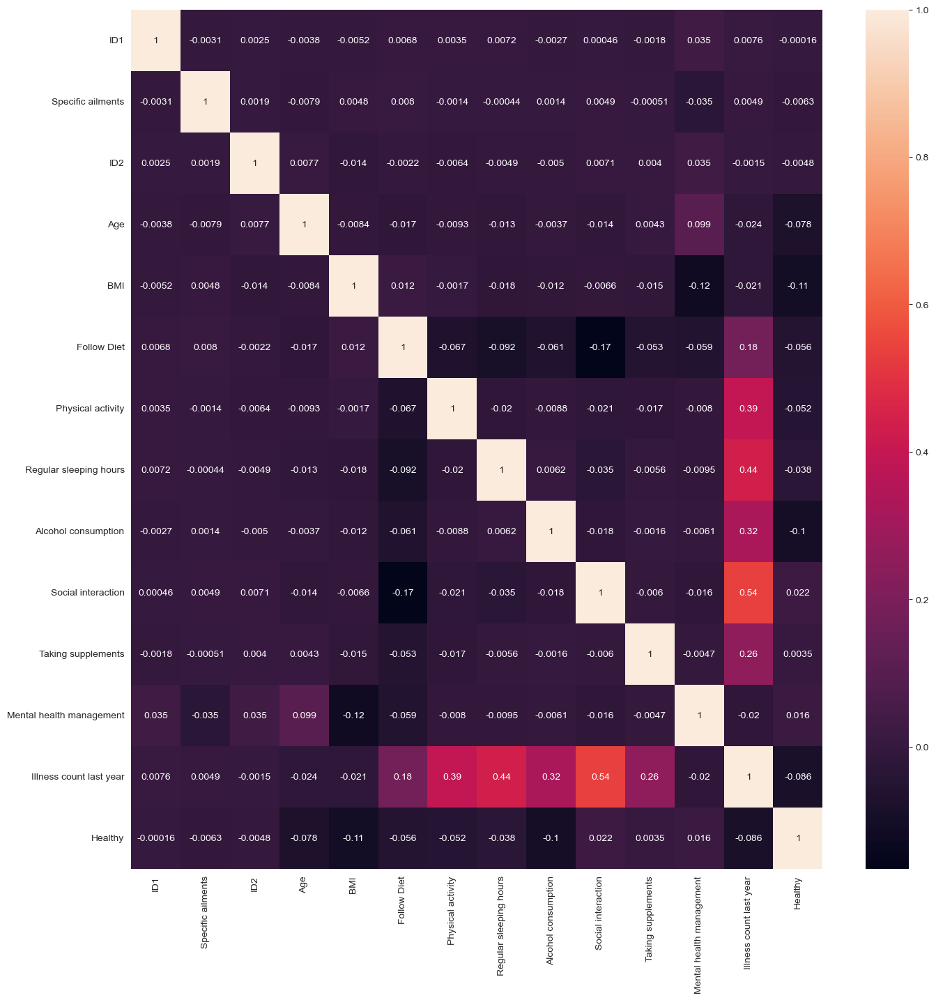

In [16]:


plt.figure(figsize = (16,16))
sns.heatmap(train.corr(), annot = True).set()



<Figure size 1600x1600 with 0 Axes>

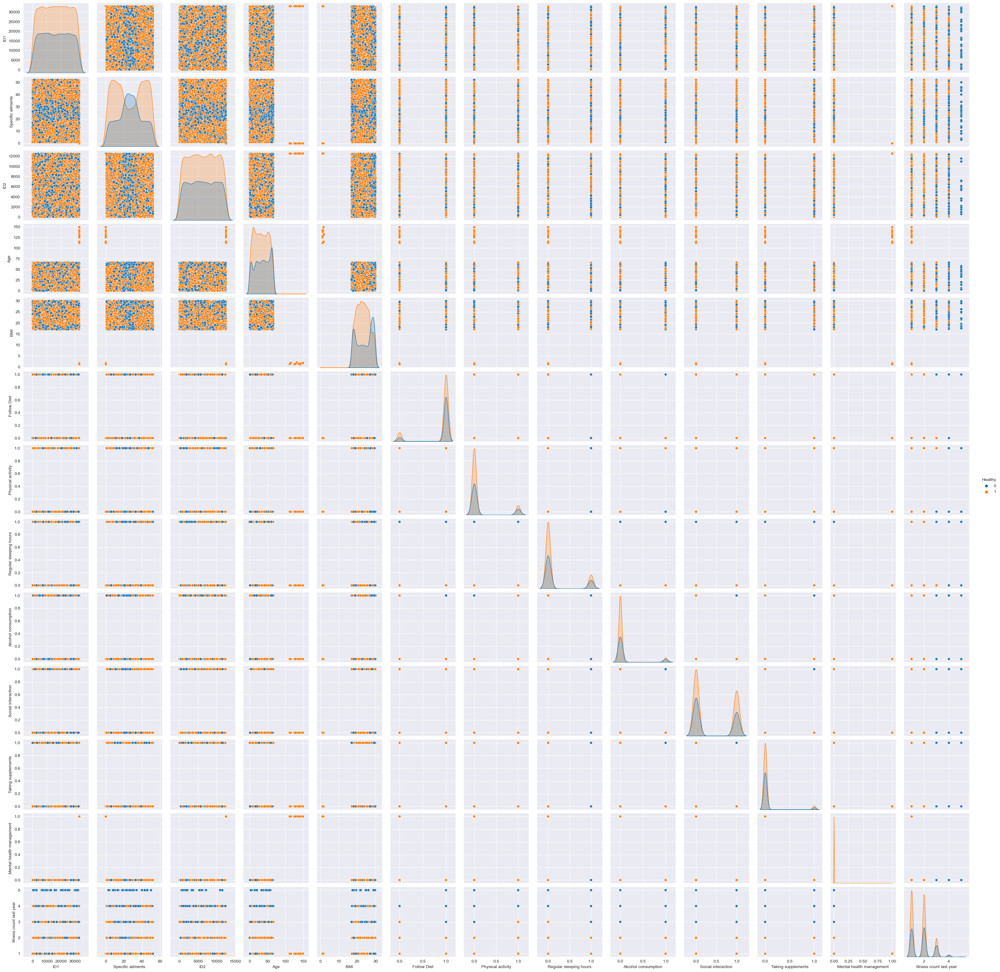

In [14]:
plt.figure(figsize = (16,16))

sns.pairplot(train, hue = 'Healthy')

In [21]:
xtrain = train.drop('Healthy', axis = 1)
ytrain = train['Healthy']

In [15]:
basedModels = []
basedModels.append(('LR'   , LogisticRegression()))
basedModels.append(('KNN'  , KNeighborsClassifier()))
basedModels.append(('NB'   , GaussianNB()))
basedModels.append(('SVM'  , SVC(probability=True)))
basedModels.append(('AB'   , AdaBoostClassifier()))
basedModels.append(('GBM'  , GradientBoostingClassifier()))
basedModels.append(('RF'   , RandomForestClassifier()))
basedModels.append(('ET'   , ExtraTreesClassifier()))
basedModels.append(('CATBOOST', CatBoostClassifier()))
basedModels.append(('XGB', XGBClassifier()))

NameError: name 'based' is not defined